# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

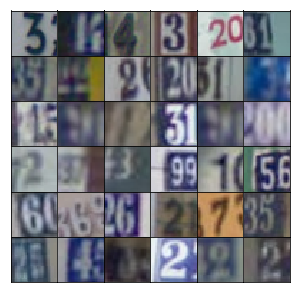

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [ ]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.4772... Generator Loss: 0.7226
Epoch 1/25... Discriminator Loss: 0.7468... Generator Loss: 1.0167
Epoch 1/25... Discriminator Loss: 0.1842... Generator Loss: 2.6150
Epoch 1/25... Discriminator Loss: 0.1872... Generator Loss: 2.5760
Epoch 1/25... Discriminator Loss: 0.1467... Generator Loss: 2.9530
Epoch 1/25... Discriminator Loss: 0.1079... Generator Loss: 2.9355
Epoch 1/25... Discriminator Loss: 0.1848... Generator Loss: 2.4887
Epoch 1/25... Discriminator Loss: 0.0977... Generator Loss: 3.3141
Epoch 1/25... Discriminator Loss: 0.1810... Generator Loss: 2.9802
Epoch 1/25... Discriminator Loss: 0.1167... Generator Loss: 3.4362


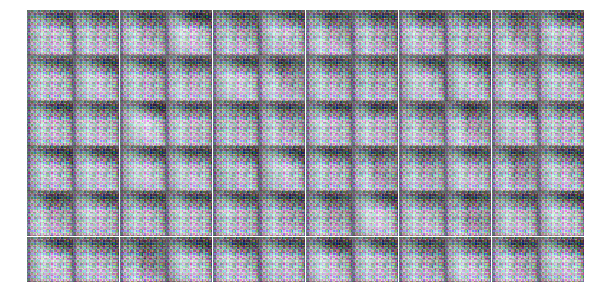

Epoch 1/25... Discriminator Loss: 0.1741... Generator Loss: 2.6092
Epoch 1/25... Discriminator Loss: 1.1999... Generator Loss: 0.9094
Epoch 1/25... Discriminator Loss: 1.0289... Generator Loss: 3.1797
Epoch 1/25... Discriminator Loss: 0.5518... Generator Loss: 1.3167
Epoch 1/25... Discriminator Loss: 0.4551... Generator Loss: 1.7247
Epoch 1/25... Discriminator Loss: 0.5628... Generator Loss: 1.2772
Epoch 1/25... Discriminator Loss: 0.3432... Generator Loss: 2.1465
Epoch 1/25... Discriminator Loss: 0.6813... Generator Loss: 3.0061
Epoch 1/25... Discriminator Loss: 0.4262... Generator Loss: 2.0275
Epoch 1/25... Discriminator Loss: 0.7244... Generator Loss: 4.3585


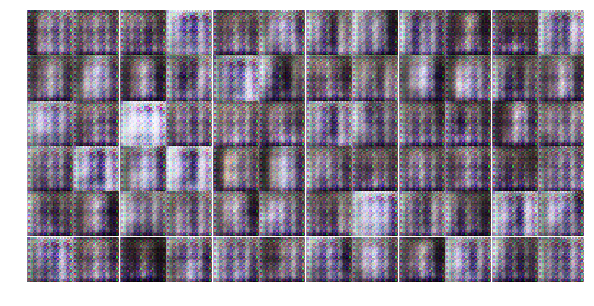

Epoch 1/25... Discriminator Loss: 0.4035... Generator Loss: 1.7179
Epoch 1/25... Discriminator Loss: 0.5040... Generator Loss: 1.8161
Epoch 1/25... Discriminator Loss: 0.7034... Generator Loss: 3.6067
Epoch 1/25... Discriminator Loss: 0.8802... Generator Loss: 0.9077
Epoch 1/25... Discriminator Loss: 0.6344... Generator Loss: 3.0921
Epoch 1/25... Discriminator Loss: 0.7666... Generator Loss: 1.3323
Epoch 1/25... Discriminator Loss: 1.1353... Generator Loss: 1.4947
Epoch 1/25... Discriminator Loss: 1.1893... Generator Loss: 0.8575
Epoch 1/25... Discriminator Loss: 0.2360... Generator Loss: 2.7296
Epoch 1/25... Discriminator Loss: 0.3828... Generator Loss: 2.0980


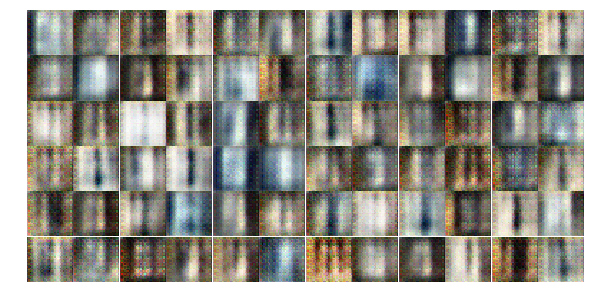

Epoch 1/25... Discriminator Loss: 0.5795... Generator Loss: 1.3854
Epoch 1/25... Discriminator Loss: 0.2485... Generator Loss: 3.6140
Epoch 1/25... Discriminator Loss: 0.7629... Generator Loss: 0.8969
Epoch 1/25... Discriminator Loss: 1.4096... Generator Loss: 3.2444
Epoch 1/25... Discriminator Loss: 0.9089... Generator Loss: 0.9531
Epoch 1/25... Discriminator Loss: 0.6019... Generator Loss: 1.4843
Epoch 1/25... Discriminator Loss: 0.4639... Generator Loss: 1.2875
Epoch 1/25... Discriminator Loss: 0.5805... Generator Loss: 3.0503
Epoch 1/25... Discriminator Loss: 0.4308... Generator Loss: 1.6971
Epoch 1/25... Discriminator Loss: 0.9708... Generator Loss: 1.7559


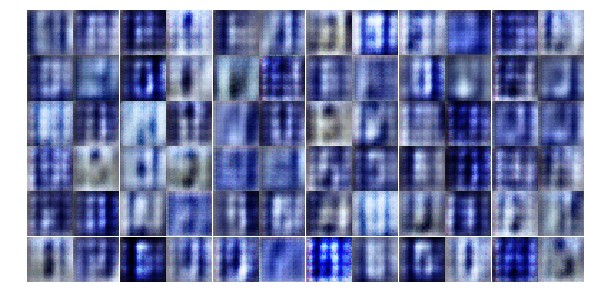

Epoch 1/25... Discriminator Loss: 0.6769... Generator Loss: 1.3148
Epoch 1/25... Discriminator Loss: 0.5364... Generator Loss: 1.6193
Epoch 1/25... Discriminator Loss: 0.4346... Generator Loss: 1.6259
Epoch 1/25... Discriminator Loss: 0.5897... Generator Loss: 1.9056
Epoch 1/25... Discriminator Loss: 0.5560... Generator Loss: 1.4026
Epoch 1/25... Discriminator Loss: 0.6665... Generator Loss: 2.2181
Epoch 1/25... Discriminator Loss: 0.7347... Generator Loss: 1.4220
Epoch 1/25... Discriminator Loss: 0.9111... Generator Loss: 1.3244
Epoch 1/25... Discriminator Loss: 0.5676... Generator Loss: 1.4785
Epoch 1/25... Discriminator Loss: 0.6758... Generator Loss: 1.3696


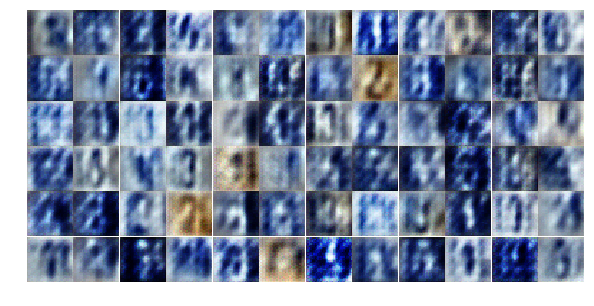

Epoch 1/25... Discriminator Loss: 0.5235... Generator Loss: 2.0145
Epoch 1/25... Discriminator Loss: 0.5218... Generator Loss: 1.6369
Epoch 1/25... Discriminator Loss: 0.8260... Generator Loss: 1.3850
Epoch 1/25... Discriminator Loss: 1.0283... Generator Loss: 0.9467
Epoch 1/25... Discriminator Loss: 0.6739... Generator Loss: 1.5981
Epoch 1/25... Discriminator Loss: 0.8309... Generator Loss: 1.0074
Epoch 1/25... Discriminator Loss: 0.7558... Generator Loss: 1.2900
Epoch 2/25... Discriminator Loss: 0.5745... Generator Loss: 1.4274
Epoch 2/25... Discriminator Loss: 0.5606... Generator Loss: 2.1721
Epoch 2/25... Discriminator Loss: 1.0270... Generator Loss: 0.8294


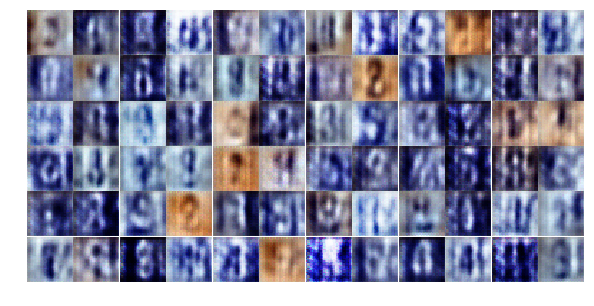

Epoch 2/25... Discriminator Loss: 0.8493... Generator Loss: 1.3091
Epoch 2/25... Discriminator Loss: 1.2703... Generator Loss: 0.7048
Epoch 2/25... Discriminator Loss: 1.4032... Generator Loss: 1.2599
Epoch 2/25... Discriminator Loss: 0.7758... Generator Loss: 1.1123
Epoch 2/25... Discriminator Loss: 0.6553... Generator Loss: 1.2992
Epoch 2/25... Discriminator Loss: 1.1235... Generator Loss: 0.8129
Epoch 2/25... Discriminator Loss: 1.1142... Generator Loss: 1.2207
Epoch 2/25... Discriminator Loss: 1.1260... Generator Loss: 0.8270
Epoch 2/25... Discriminator Loss: 0.6383... Generator Loss: 1.3842
Epoch 2/25... Discriminator Loss: 0.8806... Generator Loss: 1.3825


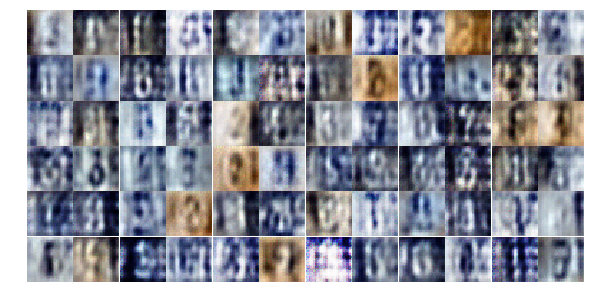

Epoch 2/25... Discriminator Loss: 1.2352... Generator Loss: 0.6170
Epoch 2/25... Discriminator Loss: 1.2744... Generator Loss: 1.0240
Epoch 2/25... Discriminator Loss: 1.3153... Generator Loss: 0.9571
Epoch 2/25... Discriminator Loss: 1.7104... Generator Loss: 0.3358
Epoch 2/25... Discriminator Loss: 0.8515... Generator Loss: 1.3693
Epoch 2/25... Discriminator Loss: 1.1984... Generator Loss: 0.7795
Epoch 2/25... Discriminator Loss: 1.1934... Generator Loss: 0.6084
Epoch 2/25... Discriminator Loss: 0.8116... Generator Loss: 0.9647
Epoch 2/25... Discriminator Loss: 0.8547... Generator Loss: 1.3278
Epoch 2/25... Discriminator Loss: 0.8133... Generator Loss: 0.8953


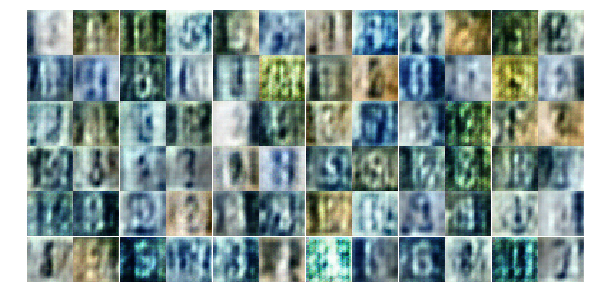

Epoch 2/25... Discriminator Loss: 1.0027... Generator Loss: 0.8506
Epoch 2/25... Discriminator Loss: 1.4417... Generator Loss: 0.4615
Epoch 2/25... Discriminator Loss: 0.8507... Generator Loss: 1.3039
Epoch 2/25... Discriminator Loss: 1.2246... Generator Loss: 1.8804
Epoch 2/25... Discriminator Loss: 0.7410... Generator Loss: 1.7681
Epoch 2/25... Discriminator Loss: 0.9832... Generator Loss: 1.1325
Epoch 2/25... Discriminator Loss: 0.8072... Generator Loss: 0.9598
Epoch 2/25... Discriminator Loss: 1.0399... Generator Loss: 0.6868
Epoch 2/25... Discriminator Loss: 1.1732... Generator Loss: 1.1042
Epoch 2/25... Discriminator Loss: 0.8016... Generator Loss: 1.3664


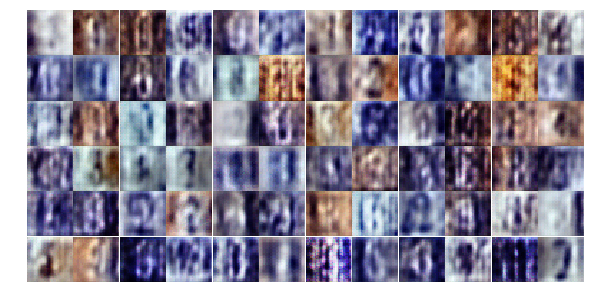

Epoch 2/25... Discriminator Loss: 1.3885... Generator Loss: 0.9595
Epoch 2/25... Discriminator Loss: 0.9544... Generator Loss: 0.9312
Epoch 2/25... Discriminator Loss: 1.3757... Generator Loss: 0.8564
Epoch 2/25... Discriminator Loss: 1.2380... Generator Loss: 0.6680
Epoch 2/25... Discriminator Loss: 0.9490... Generator Loss: 1.2661
Epoch 2/25... Discriminator Loss: 1.2269... Generator Loss: 0.7675
Epoch 2/25... Discriminator Loss: 1.9316... Generator Loss: 0.3775
Epoch 2/25... Discriminator Loss: 1.1772... Generator Loss: 1.6639
Epoch 2/25... Discriminator Loss: 0.9230... Generator Loss: 1.0849
Epoch 2/25... Discriminator Loss: 0.9206... Generator Loss: 1.2114


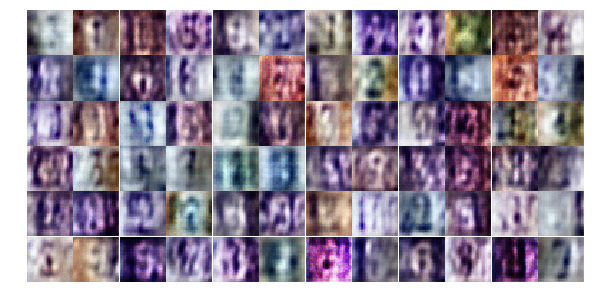

Epoch 2/25... Discriminator Loss: 0.7592... Generator Loss: 1.3084
Epoch 2/25... Discriminator Loss: 1.0103... Generator Loss: 1.7371
Epoch 2/25... Discriminator Loss: 0.8354... Generator Loss: 0.9462
Epoch 2/25... Discriminator Loss: 0.7781... Generator Loss: 1.7481
Epoch 2/25... Discriminator Loss: 0.9911... Generator Loss: 1.1419
Epoch 2/25... Discriminator Loss: 0.8236... Generator Loss: 0.9157
Epoch 2/25... Discriminator Loss: 1.1930... Generator Loss: 1.3743
Epoch 2/25... Discriminator Loss: 0.9548... Generator Loss: 0.8946
Epoch 2/25... Discriminator Loss: 0.6494... Generator Loss: 2.3533
Epoch 2/25... Discriminator Loss: 0.8998... Generator Loss: 1.5226


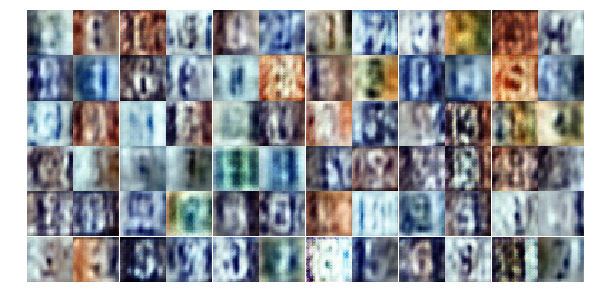

Epoch 2/25... Discriminator Loss: 0.7053... Generator Loss: 1.1362
Epoch 2/25... Discriminator Loss: 0.9392... Generator Loss: 0.7608
Epoch 2/25... Discriminator Loss: 1.1518... Generator Loss: 0.5658
Epoch 2/25... Discriminator Loss: 0.6043... Generator Loss: 1.3083
Epoch 3/25... Discriminator Loss: 0.9671... Generator Loss: 3.7119
Epoch 3/25... Discriminator Loss: 1.0434... Generator Loss: 1.5039
Epoch 3/25... Discriminator Loss: 0.8192... Generator Loss: 1.3472
Epoch 3/25... Discriminator Loss: 0.7292... Generator Loss: 1.0760
Epoch 3/25... Discriminator Loss: 1.6656... Generator Loss: 0.2921
Epoch 3/25... Discriminator Loss: 1.0936... Generator Loss: 0.8014


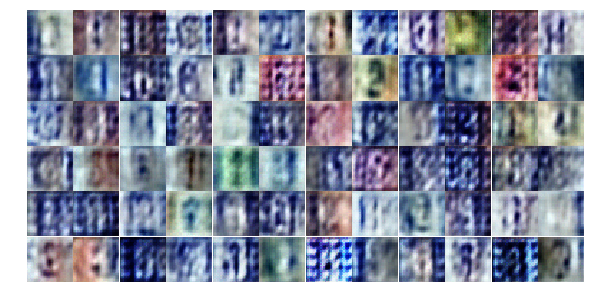

Epoch 3/25... Discriminator Loss: 0.5160... Generator Loss: 1.9562
Epoch 3/25... Discriminator Loss: 0.9627... Generator Loss: 1.1054
Epoch 3/25... Discriminator Loss: 0.7827... Generator Loss: 1.0852
Epoch 3/25... Discriminator Loss: 0.9602... Generator Loss: 0.6987
Epoch 3/25... Discriminator Loss: 1.0437... Generator Loss: 1.5440
Epoch 3/25... Discriminator Loss: 0.8270... Generator Loss: 0.9643
Epoch 3/25... Discriminator Loss: 1.2653... Generator Loss: 0.4914
Epoch 3/25... Discriminator Loss: 0.4423... Generator Loss: 1.6283
Epoch 3/25... Discriminator Loss: 0.3975... Generator Loss: 1.5885
Epoch 3/25... Discriminator Loss: 0.8178... Generator Loss: 0.7989


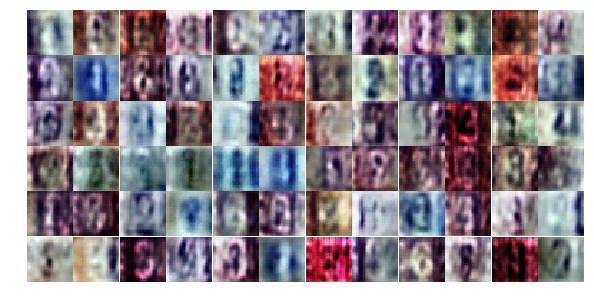

Epoch 3/25... Discriminator Loss: 1.5138... Generator Loss: 2.2966
Epoch 3/25... Discriminator Loss: 0.4499... Generator Loss: 1.5331
Epoch 3/25... Discriminator Loss: 0.3922... Generator Loss: 1.6014
Epoch 3/25... Discriminator Loss: 0.8670... Generator Loss: 2.2260
Epoch 3/25... Discriminator Loss: 0.7856... Generator Loss: 2.6285
Epoch 3/25... Discriminator Loss: 0.3791... Generator Loss: 2.0394
Epoch 3/25... Discriminator Loss: 0.3098... Generator Loss: 2.8922
Epoch 3/25... Discriminator Loss: 1.1066... Generator Loss: 2.4459
Epoch 3/25... Discriminator Loss: 0.8209... Generator Loss: 1.0604
Epoch 3/25... Discriminator Loss: 1.2907... Generator Loss: 0.4528


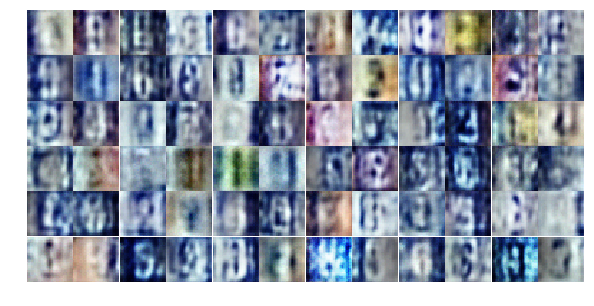

Epoch 3/25... Discriminator Loss: 1.3493... Generator Loss: 1.8930
Epoch 3/25... Discriminator Loss: 0.7172... Generator Loss: 1.8442
Epoch 3/25... Discriminator Loss: 1.1019... Generator Loss: 1.9551
Epoch 3/25... Discriminator Loss: 0.7393... Generator Loss: 0.8908
Epoch 3/25... Discriminator Loss: 0.4093... Generator Loss: 1.7653
Epoch 3/25... Discriminator Loss: 0.9156... Generator Loss: 0.9096
Epoch 3/25... Discriminator Loss: 0.7601... Generator Loss: 1.2251
Epoch 3/25... Discriminator Loss: 0.4318... Generator Loss: 1.6581
Epoch 3/25... Discriminator Loss: 0.5259... Generator Loss: 1.2205
Epoch 3/25... Discriminator Loss: 0.5691... Generator Loss: 1.5118


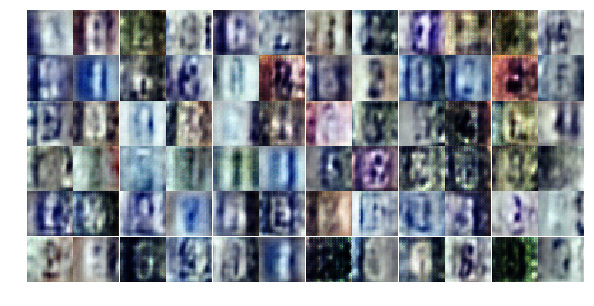

Epoch 3/25... Discriminator Loss: 0.5519... Generator Loss: 1.8366
Epoch 3/25... Discriminator Loss: 0.6023... Generator Loss: 1.8535
Epoch 3/25... Discriminator Loss: 0.3895... Generator Loss: 1.9961
Epoch 3/25... Discriminator Loss: 0.4840... Generator Loss: 1.5154
Epoch 3/25... Discriminator Loss: 0.4106... Generator Loss: 3.5194
Epoch 3/25... Discriminator Loss: 0.3356... Generator Loss: 1.7700
Epoch 3/25... Discriminator Loss: 0.5365... Generator Loss: 2.0087
Epoch 3/25... Discriminator Loss: 1.6902... Generator Loss: 0.3629
Epoch 3/25... Discriminator Loss: 1.0426... Generator Loss: 2.1112
Epoch 3/25... Discriminator Loss: 1.4059... Generator Loss: 0.7753


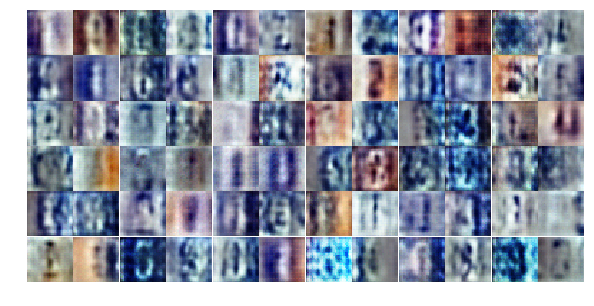

Epoch 3/25... Discriminator Loss: 1.9507... Generator Loss: 0.2094
Epoch 3/25... Discriminator Loss: 1.0054... Generator Loss: 1.2341
Epoch 3/25... Discriminator Loss: 0.5833... Generator Loss: 1.5934
Epoch 3/25... Discriminator Loss: 0.6164... Generator Loss: 1.1377
Epoch 3/25... Discriminator Loss: 0.9735... Generator Loss: 2.6310
Epoch 3/25... Discriminator Loss: 0.4956... Generator Loss: 2.3961
Epoch 3/25... Discriminator Loss: 0.5684... Generator Loss: 1.5884
Epoch 3/25... Discriminator Loss: 0.3512... Generator Loss: 2.8832
Epoch 3/25... Discriminator Loss: 0.5239... Generator Loss: 1.6520
Epoch 3/25... Discriminator Loss: 0.2925... Generator Loss: 2.4764


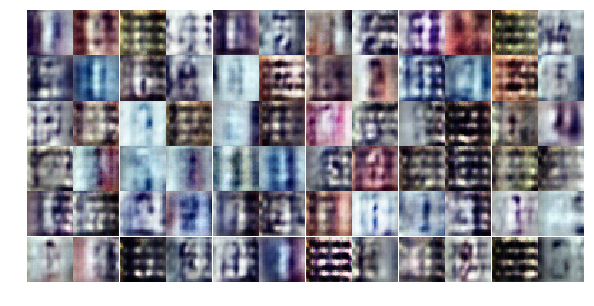

Epoch 3/25... Discriminator Loss: 1.5179... Generator Loss: 0.3719
Epoch 4/25... Discriminator Loss: 0.7707... Generator Loss: 1.0030
Epoch 4/25... Discriminator Loss: 0.8860... Generator Loss: 1.2599
Epoch 4/25... Discriminator Loss: 0.6896... Generator Loss: 1.3249
Epoch 4/25... Discriminator Loss: 0.5217... Generator Loss: 1.6664
Epoch 4/25... Discriminator Loss: 0.6194... Generator Loss: 1.1896
Epoch 4/25... Discriminator Loss: 0.5700... Generator Loss: 1.7180
Epoch 4/25... Discriminator Loss: 0.6263... Generator Loss: 1.4037
Epoch 4/25... Discriminator Loss: 0.5522... Generator Loss: 1.1901
Epoch 4/25... Discriminator Loss: 0.3585... Generator Loss: 2.3746


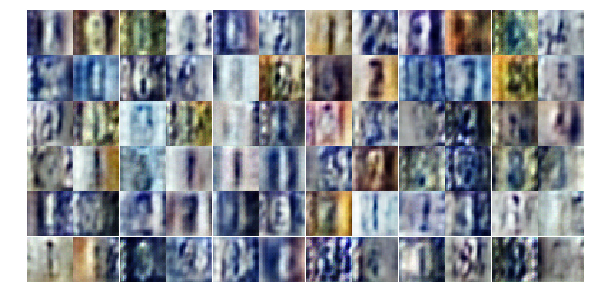

Epoch 4/25... Discriminator Loss: 0.3866... Generator Loss: 2.6041
Epoch 4/25... Discriminator Loss: 0.7574... Generator Loss: 0.9722
Epoch 4/25... Discriminator Loss: 0.9247... Generator Loss: 0.9132
Epoch 4/25... Discriminator Loss: 0.4881... Generator Loss: 1.5072
Epoch 4/25... Discriminator Loss: 0.5464... Generator Loss: 1.9208
Epoch 4/25... Discriminator Loss: 0.7592... Generator Loss: 0.9479
Epoch 4/25... Discriminator Loss: 0.9810... Generator Loss: 0.9287
Epoch 4/25... Discriminator Loss: 0.6376... Generator Loss: 1.0469
Epoch 4/25... Discriminator Loss: 0.5676... Generator Loss: 1.3404
Epoch 4/25... Discriminator Loss: 0.9617... Generator Loss: 0.6967


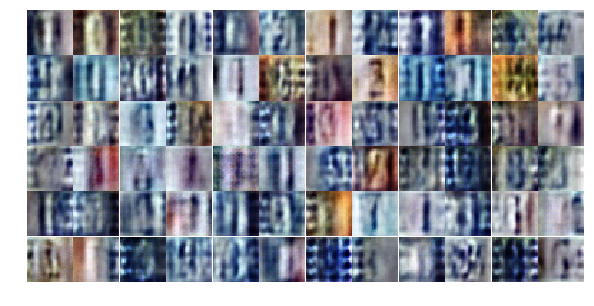

Epoch 4/25... Discriminator Loss: 0.4382... Generator Loss: 1.6191
Epoch 4/25... Discriminator Loss: 0.6224... Generator Loss: 1.4442
Epoch 4/25... Discriminator Loss: 0.8883... Generator Loss: 0.7351
Epoch 4/25... Discriminator Loss: 0.6132... Generator Loss: 1.2780
Epoch 4/25... Discriminator Loss: 0.3109... Generator Loss: 1.8765
Epoch 4/25... Discriminator Loss: 1.1653... Generator Loss: 3.4183
Epoch 4/25... Discriminator Loss: 1.1311... Generator Loss: 0.5845
Epoch 4/25... Discriminator Loss: 1.0407... Generator Loss: 0.6635
Epoch 4/25... Discriminator Loss: 0.4863... Generator Loss: 1.3549
Epoch 4/25... Discriminator Loss: 0.4741... Generator Loss: 2.3709


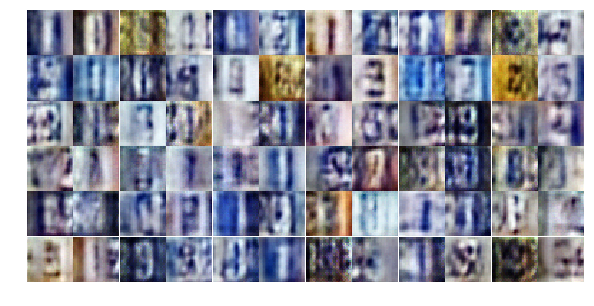

Epoch 4/25... Discriminator Loss: 0.4472... Generator Loss: 2.0949
Epoch 4/25... Discriminator Loss: 0.5823... Generator Loss: 1.3514
Epoch 4/25... Discriminator Loss: 0.4936... Generator Loss: 1.5041
Epoch 4/25... Discriminator Loss: 0.5131... Generator Loss: 2.2024
Epoch 4/25... Discriminator Loss: 0.3690... Generator Loss: 2.0678
Epoch 4/25... Discriminator Loss: 0.6188... Generator Loss: 1.0745
Epoch 4/25... Discriminator Loss: 0.3597... Generator Loss: 2.4812
Epoch 4/25... Discriminator Loss: 0.6296... Generator Loss: 2.2710
Epoch 4/25... Discriminator Loss: 0.8925... Generator Loss: 0.7441
Epoch 4/25... Discriminator Loss: 0.9139... Generator Loss: 1.0381


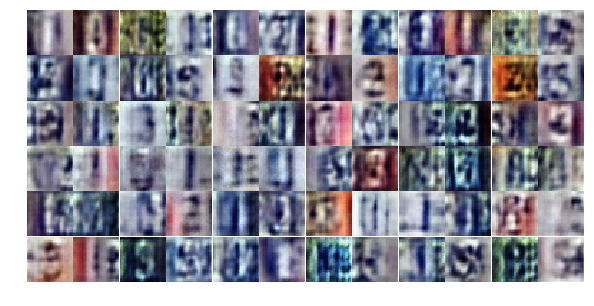

Epoch 4/25... Discriminator Loss: 0.6781... Generator Loss: 1.6607
Epoch 4/25... Discriminator Loss: 0.5701... Generator Loss: 1.2273
Epoch 4/25... Discriminator Loss: 0.9224... Generator Loss: 1.2598
Epoch 4/25... Discriminator Loss: 0.5501... Generator Loss: 2.1721
Epoch 4/25... Discriminator Loss: 0.4453... Generator Loss: 1.8214
Epoch 4/25... Discriminator Loss: 0.7039... Generator Loss: 1.2986
Epoch 4/25... Discriminator Loss: 1.7736... Generator Loss: 0.2835
Epoch 4/25... Discriminator Loss: 0.7232... Generator Loss: 1.8053
Epoch 4/25... Discriminator Loss: 0.5130... Generator Loss: 1.6126
Epoch 4/25... Discriminator Loss: 0.5259... Generator Loss: 1.7503


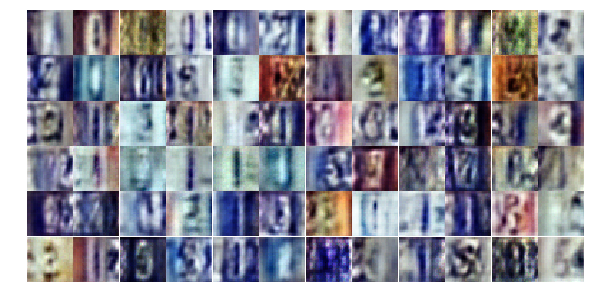

Epoch 4/25... Discriminator Loss: 0.3743... Generator Loss: 1.7882
Epoch 4/25... Discriminator Loss: 0.4338... Generator Loss: 2.7204
Epoch 4/25... Discriminator Loss: 0.3932... Generator Loss: 1.8649
Epoch 4/25... Discriminator Loss: 1.5375... Generator Loss: 4.0218
Epoch 4/25... Discriminator Loss: 0.9239... Generator Loss: 0.7625
Epoch 4/25... Discriminator Loss: 0.4497... Generator Loss: 1.4591
Epoch 4/25... Discriminator Loss: 0.3980... Generator Loss: 1.5982
Epoch 4/25... Discriminator Loss: 0.7387... Generator Loss: 0.9891
Epoch 4/25... Discriminator Loss: 0.5053... Generator Loss: 1.6295
Epoch 5/25... Discriminator Loss: 0.4903... Generator Loss: 1.5792


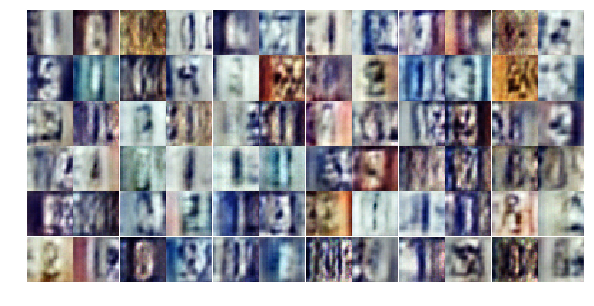

Epoch 5/25... Discriminator Loss: 0.5384... Generator Loss: 1.4866
Epoch 5/25... Discriminator Loss: 0.5830... Generator Loss: 1.1993
Epoch 5/25... Discriminator Loss: 0.5600... Generator Loss: 1.2643
Epoch 5/25... Discriminator Loss: 0.3923... Generator Loss: 1.5416
Epoch 5/25... Discriminator Loss: 0.5654... Generator Loss: 1.2301
Epoch 5/25... Discriminator Loss: 0.9144... Generator Loss: 0.7225
Epoch 5/25... Discriminator Loss: 0.8274... Generator Loss: 3.1139
Epoch 5/25... Discriminator Loss: 0.3946... Generator Loss: 1.8392
Epoch 5/25... Discriminator Loss: 1.0393... Generator Loss: 0.5958
Epoch 5/25... Discriminator Loss: 0.9107... Generator Loss: 1.2109


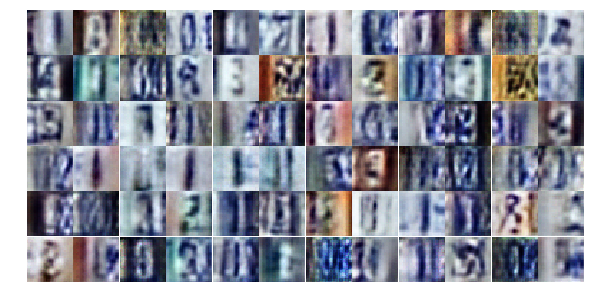

Epoch 5/25... Discriminator Loss: 0.6606... Generator Loss: 1.2512
Epoch 5/25... Discriminator Loss: 0.4932... Generator Loss: 1.3126
Epoch 5/25... Discriminator Loss: 0.3163... Generator Loss: 1.9517
Epoch 5/25... Discriminator Loss: 1.4979... Generator Loss: 0.4017
Epoch 5/25... Discriminator Loss: 1.2955... Generator Loss: 1.1359
Epoch 5/25... Discriminator Loss: 0.7969... Generator Loss: 1.3055
Epoch 5/25... Discriminator Loss: 0.6160... Generator Loss: 1.7905
Epoch 5/25... Discriminator Loss: 0.6915... Generator Loss: 1.3460
Epoch 5/25... Discriminator Loss: 0.4954... Generator Loss: 1.4256
Epoch 5/25... Discriminator Loss: 0.6415... Generator Loss: 1.0598


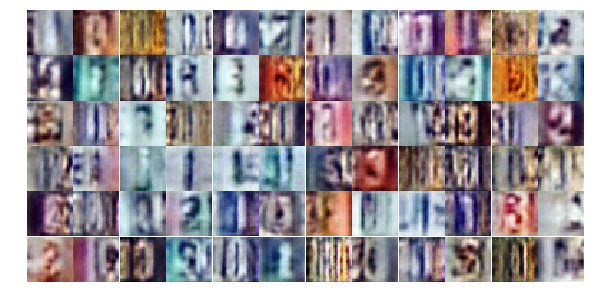

Epoch 5/25... Discriminator Loss: 0.2814... Generator Loss: 1.9784
Epoch 5/25... Discriminator Loss: 0.6643... Generator Loss: 2.2086
Epoch 5/25... Discriminator Loss: 0.6702... Generator Loss: 0.9787
Epoch 5/25... Discriminator Loss: 0.4584... Generator Loss: 1.5141
Epoch 5/25... Discriminator Loss: 0.7793... Generator Loss: 0.8355
Epoch 5/25... Discriminator Loss: 0.6375... Generator Loss: 1.0132
Epoch 5/25... Discriminator Loss: 0.8377... Generator Loss: 0.7333
Epoch 5/25... Discriminator Loss: 0.5284... Generator Loss: 1.6308
Epoch 5/25... Discriminator Loss: 1.3814... Generator Loss: 0.5004
Epoch 5/25... Discriminator Loss: 0.3975... Generator Loss: 1.8373


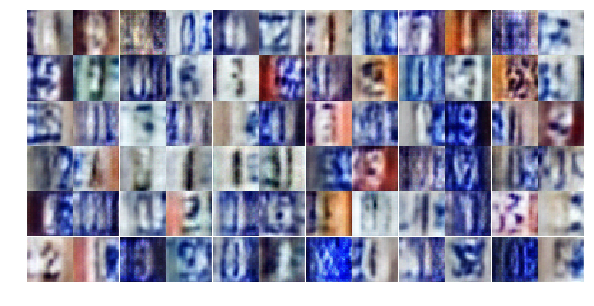

Epoch 5/25... Discriminator Loss: 0.4988... Generator Loss: 1.4943
Epoch 5/25... Discriminator Loss: 0.3817... Generator Loss: 1.6814
Epoch 5/25... Discriminator Loss: 0.5401... Generator Loss: 1.2876
Epoch 5/25... Discriminator Loss: 0.4536... Generator Loss: 1.4160
Epoch 5/25... Discriminator Loss: 1.0172... Generator Loss: 0.6170
Epoch 5/25... Discriminator Loss: 0.6599... Generator Loss: 1.8321
Epoch 5/25... Discriminator Loss: 0.4822... Generator Loss: 1.9114
Epoch 5/25... Discriminator Loss: 0.6419... Generator Loss: 1.0563
Epoch 5/25... Discriminator Loss: 0.7292... Generator Loss: 0.9135
Epoch 5/25... Discriminator Loss: 0.6255... Generator Loss: 1.0519


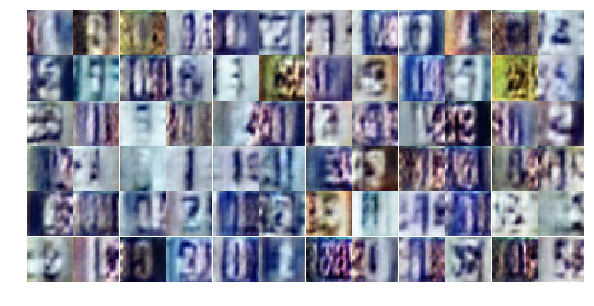

Epoch 5/25... Discriminator Loss: 0.2488... Generator Loss: 2.4795
Epoch 5/25... Discriminator Loss: 0.6881... Generator Loss: 0.8905
Epoch 5/25... Discriminator Loss: 0.6131... Generator Loss: 1.0278
Epoch 5/25... Discriminator Loss: 0.3584... Generator Loss: 1.8552
Epoch 5/25... Discriminator Loss: 0.6599... Generator Loss: 1.0570
Epoch 5/25... Discriminator Loss: 0.5356... Generator Loss: 1.2666
Epoch 5/25... Discriminator Loss: 1.8129... Generator Loss: 4.3319
Epoch 5/25... Discriminator Loss: 0.8174... Generator Loss: 2.0115
Epoch 5/25... Discriminator Loss: 0.7074... Generator Loss: 1.5544
Epoch 5/25... Discriminator Loss: 0.5123... Generator Loss: 1.7012


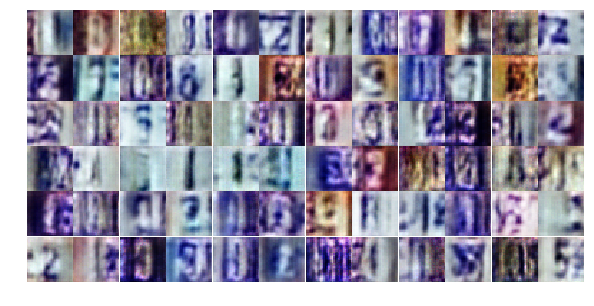

Epoch 5/25... Discriminator Loss: 0.8299... Generator Loss: 0.8240
Epoch 5/25... Discriminator Loss: 0.5928... Generator Loss: 1.6501
Epoch 5/25... Discriminator Loss: 1.0231... Generator Loss: 2.8750
Epoch 5/25... Discriminator Loss: 0.6790... Generator Loss: 1.2405
Epoch 5/25... Discriminator Loss: 0.6558... Generator Loss: 1.0849
Epoch 5/25... Discriminator Loss: 0.8122... Generator Loss: 0.8353
Epoch 6/25... Discriminator Loss: 0.7426... Generator Loss: 0.9571
Epoch 6/25... Discriminator Loss: 0.3221... Generator Loss: 1.9187
Epoch 6/25... Discriminator Loss: 0.5175... Generator Loss: 1.5393
Epoch 6/25... Discriminator Loss: 0.5873... Generator Loss: 1.1194


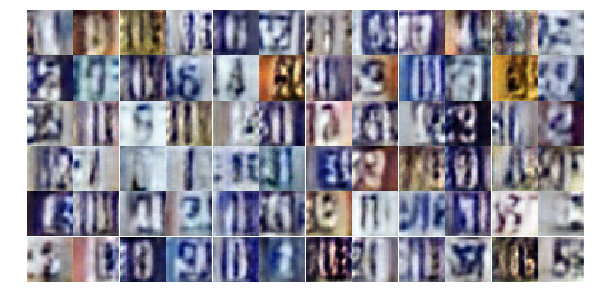

Epoch 6/25... Discriminator Loss: 0.6085... Generator Loss: 1.0770
Epoch 6/25... Discriminator Loss: 0.8178... Generator Loss: 0.9612
Epoch 6/25... Discriminator Loss: 0.8118... Generator Loss: 1.4368
Epoch 6/25... Discriminator Loss: 1.3948... Generator Loss: 0.4539
Epoch 6/25... Discriminator Loss: 0.8267... Generator Loss: 0.8100
Epoch 6/25... Discriminator Loss: 0.5887... Generator Loss: 1.5703
Epoch 6/25... Discriminator Loss: 0.5299... Generator Loss: 2.2158
Epoch 6/25... Discriminator Loss: 1.4855... Generator Loss: 0.3392
Epoch 6/25... Discriminator Loss: 0.7180... Generator Loss: 0.8918
Epoch 6/25... Discriminator Loss: 0.4302... Generator Loss: 2.4058


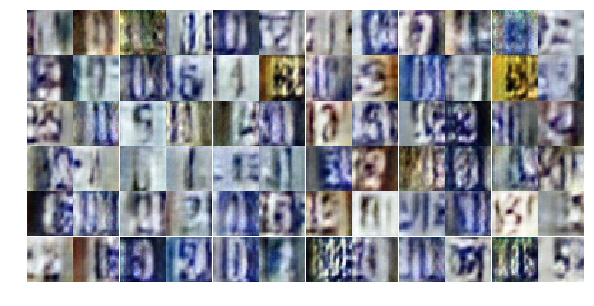

Epoch 6/25... Discriminator Loss: 0.7570... Generator Loss: 2.3642
Epoch 6/25... Discriminator Loss: 2.4276... Generator Loss: 3.5686
Epoch 6/25... Discriminator Loss: 1.7323... Generator Loss: 0.3926
Epoch 6/25... Discriminator Loss: 0.4356... Generator Loss: 1.6870
Epoch 6/25... Discriminator Loss: 0.4087... Generator Loss: 2.2322
Epoch 6/25... Discriminator Loss: 0.4057... Generator Loss: 1.4752
Epoch 6/25... Discriminator Loss: 0.9346... Generator Loss: 0.7245
Epoch 6/25... Discriminator Loss: 0.7132... Generator Loss: 0.9286
Epoch 6/25... Discriminator Loss: 0.5401... Generator Loss: 1.4642
Epoch 6/25... Discriminator Loss: 0.7679... Generator Loss: 1.5179


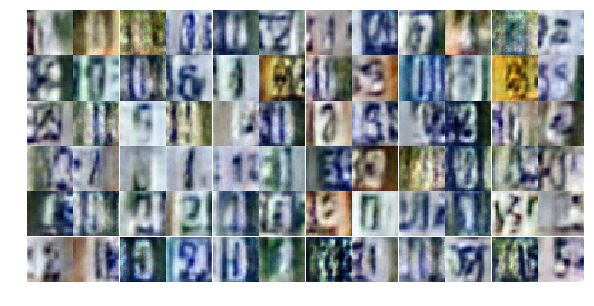

Epoch 6/25... Discriminator Loss: 0.7738... Generator Loss: 0.8152
Epoch 6/25... Discriminator Loss: 0.5414... Generator Loss: 1.1847
Epoch 6/25... Discriminator Loss: 0.9320... Generator Loss: 0.6904
Epoch 6/25... Discriminator Loss: 0.5497... Generator Loss: 1.1900
Epoch 6/25... Discriminator Loss: 0.5162... Generator Loss: 2.4498
Epoch 6/25... Discriminator Loss: 1.5880... Generator Loss: 0.3570
Epoch 6/25... Discriminator Loss: 0.6711... Generator Loss: 1.1827
Epoch 6/25... Discriminator Loss: 0.2942... Generator Loss: 2.0665
Epoch 6/25... Discriminator Loss: 0.7512... Generator Loss: 0.8284
Epoch 6/25... Discriminator Loss: 0.5779... Generator Loss: 1.1984


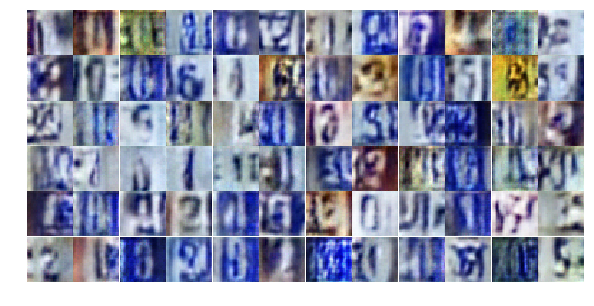

Epoch 6/25... Discriminator Loss: 1.9106... Generator Loss: 0.2138
Epoch 6/25... Discriminator Loss: 0.5601... Generator Loss: 1.3759
Epoch 6/25... Discriminator Loss: 0.7407... Generator Loss: 1.2007
Epoch 6/25... Discriminator Loss: 0.5202... Generator Loss: 1.4350
Epoch 6/25... Discriminator Loss: 0.6337... Generator Loss: 1.0381
Epoch 6/25... Discriminator Loss: 1.1031... Generator Loss: 0.5929
Epoch 6/25... Discriminator Loss: 0.5597... Generator Loss: 1.3190
Epoch 6/25... Discriminator Loss: 0.4360... Generator Loss: 1.5905
Epoch 6/25... Discriminator Loss: 0.7449... Generator Loss: 1.0139
Epoch 6/25... Discriminator Loss: 0.5800... Generator Loss: 1.1179


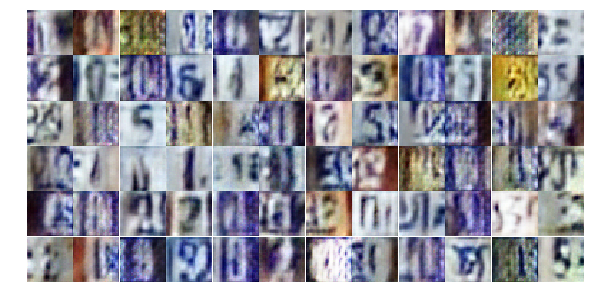

Epoch 6/25... Discriminator Loss: 1.5059... Generator Loss: 0.3130
Epoch 6/25... Discriminator Loss: 0.7811... Generator Loss: 1.9479
Epoch 6/25... Discriminator Loss: 0.9283... Generator Loss: 0.7353
Epoch 6/25... Discriminator Loss: 0.5991... Generator Loss: 1.3076
Epoch 6/25... Discriminator Loss: 0.5071... Generator Loss: 1.9496
Epoch 6/25... Discriminator Loss: 0.5505... Generator Loss: 1.3168
Epoch 6/25... Discriminator Loss: 0.8207... Generator Loss: 0.7800
Epoch 6/25... Discriminator Loss: 0.9701... Generator Loss: 0.6191
Epoch 6/25... Discriminator Loss: 0.5718... Generator Loss: 1.3547
Epoch 6/25... Discriminator Loss: 1.6444... Generator Loss: 0.2697


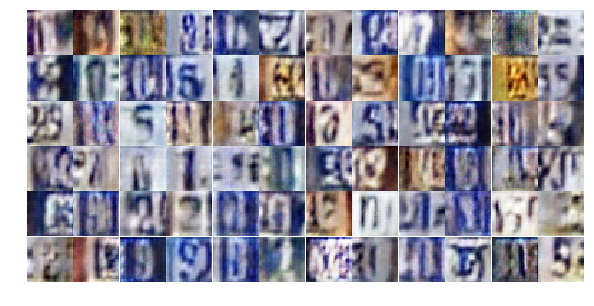

Epoch 6/25... Discriminator Loss: 0.6684... Generator Loss: 1.4307
Epoch 6/25... Discriminator Loss: 0.4630... Generator Loss: 1.7850
Epoch 6/25... Discriminator Loss: 0.8038... Generator Loss: 1.0798
Epoch 7/25... Discriminator Loss: 0.6093... Generator Loss: 1.7506
Epoch 7/25... Discriminator Loss: 0.9544... Generator Loss: 2.0915
Epoch 7/25... Discriminator Loss: 0.5285... Generator Loss: 1.7761
Epoch 7/25... Discriminator Loss: 0.4418... Generator Loss: 1.5431
Epoch 7/25... Discriminator Loss: 0.4878... Generator Loss: 1.4717
Epoch 7/25... Discriminator Loss: 0.3995... Generator Loss: 1.7496
Epoch 7/25... Discriminator Loss: 0.7947... Generator Loss: 0.8466


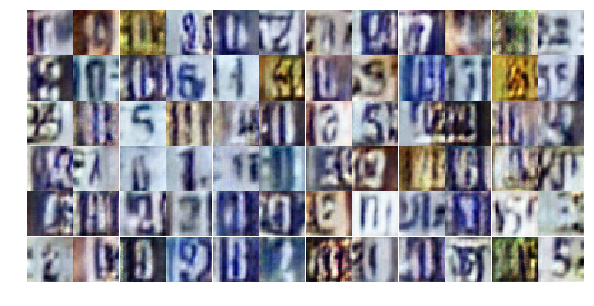

Epoch 7/25... Discriminator Loss: 0.4120... Generator Loss: 1.7175
Epoch 7/25... Discriminator Loss: 1.0490... Generator Loss: 0.6109
Epoch 7/25... Discriminator Loss: 1.0748... Generator Loss: 0.5667
Epoch 7/25... Discriminator Loss: 0.5819... Generator Loss: 1.8360
Epoch 7/25... Discriminator Loss: 0.8200... Generator Loss: 0.9232
Epoch 7/25... Discriminator Loss: 0.8772... Generator Loss: 0.7466
Epoch 7/25... Discriminator Loss: 0.6942... Generator Loss: 2.1169
Epoch 7/25... Discriminator Loss: 0.5337... Generator Loss: 1.5512
Epoch 7/25... Discriminator Loss: 0.7969... Generator Loss: 3.1785
Epoch 7/25... Discriminator Loss: 0.3737... Generator Loss: 1.6772


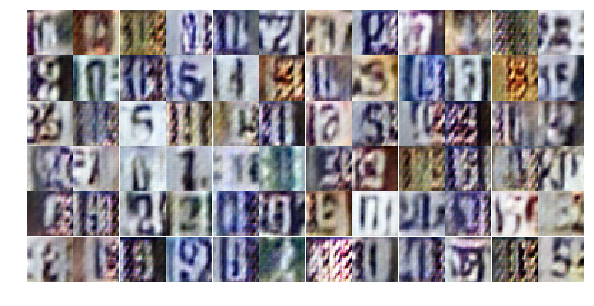

Epoch 7/25... Discriminator Loss: 0.5305... Generator Loss: 1.6191
Epoch 7/25... Discriminator Loss: 0.6973... Generator Loss: 0.9676
Epoch 7/25... Discriminator Loss: 0.6314... Generator Loss: 1.3193
Epoch 7/25... Discriminator Loss: 0.6335... Generator Loss: 1.4437
Epoch 7/25... Discriminator Loss: 0.4558... Generator Loss: 1.7937
Epoch 7/25... Discriminator Loss: 0.5644... Generator Loss: 1.4330
Epoch 7/25... Discriminator Loss: 0.5579... Generator Loss: 1.4249
Epoch 7/25... Discriminator Loss: 1.5479... Generator Loss: 0.3259
Epoch 7/25... Discriminator Loss: 0.5147... Generator Loss: 1.5111
Epoch 7/25... Discriminator Loss: 0.4115... Generator Loss: 1.6573


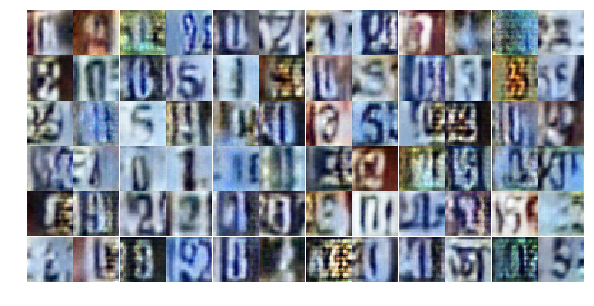

Epoch 7/25... Discriminator Loss: 0.5950... Generator Loss: 1.1373
Epoch 7/25... Discriminator Loss: 0.9353... Generator Loss: 0.7406
Epoch 7/25... Discriminator Loss: 0.3956... Generator Loss: 2.0337
Epoch 7/25... Discriminator Loss: 0.5453... Generator Loss: 1.2518
Epoch 7/25... Discriminator Loss: 0.8836... Generator Loss: 0.7652
Epoch 7/25... Discriminator Loss: 0.9322... Generator Loss: 0.6512
Epoch 7/25... Discriminator Loss: 0.6300... Generator Loss: 1.0612
Epoch 7/25... Discriminator Loss: 0.7361... Generator Loss: 0.9717
Epoch 7/25... Discriminator Loss: 1.7045... Generator Loss: 0.2734
Epoch 7/25... Discriminator Loss: 0.5802... Generator Loss: 1.6086


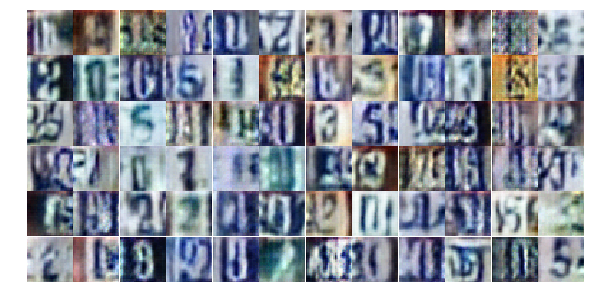

Epoch 7/25... Discriminator Loss: 0.6652... Generator Loss: 1.4882
Epoch 7/25... Discriminator Loss: 0.9597... Generator Loss: 0.8714
Epoch 7/25... Discriminator Loss: 0.5257... Generator Loss: 1.2970
Epoch 7/25... Discriminator Loss: 0.5309... Generator Loss: 1.5212
Epoch 7/25... Discriminator Loss: 0.7797... Generator Loss: 0.8598
Epoch 7/25... Discriminator Loss: 0.4508... Generator Loss: 2.1865
Epoch 7/25... Discriminator Loss: 0.5898... Generator Loss: 1.0895
Epoch 7/25... Discriminator Loss: 0.7140... Generator Loss: 1.1143
Epoch 7/25... Discriminator Loss: 0.3335... Generator Loss: 2.5441
Epoch 7/25... Discriminator Loss: 0.6611... Generator Loss: 1.1308


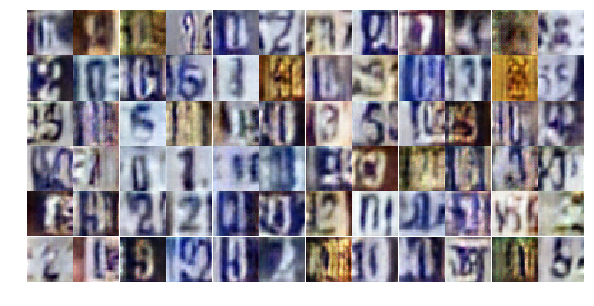

Epoch 7/25... Discriminator Loss: 0.2750... Generator Loss: 2.5581
Epoch 7/25... Discriminator Loss: 0.4822... Generator Loss: 1.5793
Epoch 7/25... Discriminator Loss: 0.7885... Generator Loss: 1.0248
Epoch 7/25... Discriminator Loss: 0.4309... Generator Loss: 1.5763
Epoch 7/25... Discriminator Loss: 1.6420... Generator Loss: 0.3008
Epoch 7/25... Discriminator Loss: 0.7319... Generator Loss: 1.1055
Epoch 7/25... Discriminator Loss: 0.9408... Generator Loss: 0.6657
Epoch 7/25... Discriminator Loss: 0.5394... Generator Loss: 1.3021
Epoch 7/25... Discriminator Loss: 0.7285... Generator Loss: 1.1208
Epoch 7/25... Discriminator Loss: 0.9103... Generator Loss: 0.6940


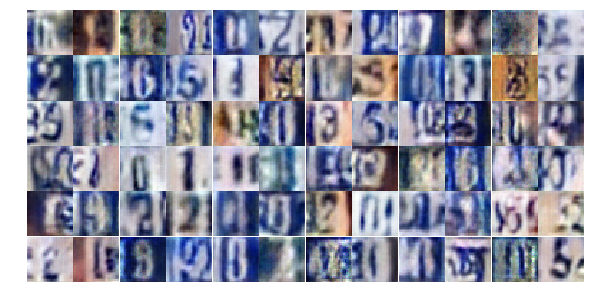

Epoch 7/25... Discriminator Loss: 0.5635... Generator Loss: 1.9974
Epoch 8/25... Discriminator Loss: 0.9604... Generator Loss: 0.6909
Epoch 8/25... Discriminator Loss: 1.0358... Generator Loss: 0.5475
Epoch 8/25... Discriminator Loss: 0.7011... Generator Loss: 1.0940
Epoch 8/25... Discriminator Loss: 0.5898... Generator Loss: 1.2920
Epoch 8/25... Discriminator Loss: 0.8216... Generator Loss: 1.1854
Epoch 8/25... Discriminator Loss: 0.5137... Generator Loss: 1.3568
Epoch 8/25... Discriminator Loss: 0.7470... Generator Loss: 2.7373
Epoch 8/25... Discriminator Loss: 0.8253... Generator Loss: 0.8814
Epoch 8/25... Discriminator Loss: 0.6619... Generator Loss: 1.0066


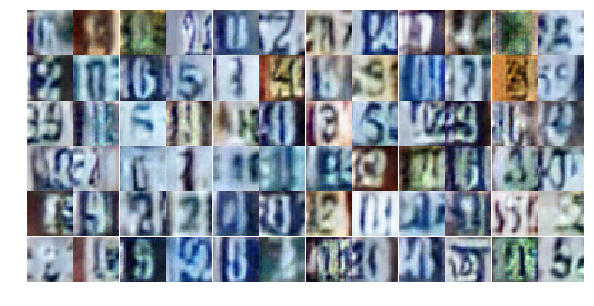

Epoch 8/25... Discriminator Loss: 0.5884... Generator Loss: 1.5121
Epoch 8/25... Discriminator Loss: 0.3986... Generator Loss: 1.8771
Epoch 8/25... Discriminator Loss: 0.7075... Generator Loss: 1.1114
Epoch 8/25... Discriminator Loss: 0.2886... Generator Loss: 2.1049
Epoch 8/25... Discriminator Loss: 0.8843... Generator Loss: 2.9137
Epoch 8/25... Discriminator Loss: 0.7187... Generator Loss: 1.8214
Epoch 8/25... Discriminator Loss: 0.5576... Generator Loss: 1.4809
Epoch 8/25... Discriminator Loss: 0.5715... Generator Loss: 1.4742
Epoch 8/25... Discriminator Loss: 0.6682... Generator Loss: 1.0457
Epoch 8/25... Discriminator Loss: 1.3768... Generator Loss: 0.3957


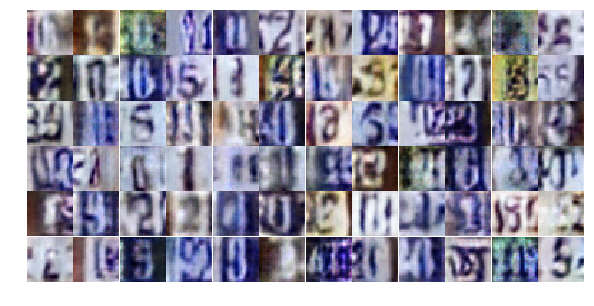

Epoch 8/25... Discriminator Loss: 0.3780... Generator Loss: 2.0279
Epoch 8/25... Discriminator Loss: 0.6644... Generator Loss: 1.0272
Epoch 8/25... Discriminator Loss: 0.6654... Generator Loss: 1.0735
Epoch 8/25... Discriminator Loss: 0.7371... Generator Loss: 1.2153
Epoch 8/25... Discriminator Loss: 0.4653... Generator Loss: 1.6262
Epoch 8/25... Discriminator Loss: 0.5366... Generator Loss: 1.4808
Epoch 8/25... Discriminator Loss: 0.6382... Generator Loss: 1.3220
Epoch 8/25... Discriminator Loss: 0.5221... Generator Loss: 1.2166
Epoch 8/25... Discriminator Loss: 0.8184... Generator Loss: 2.2863
Epoch 8/25... Discriminator Loss: 1.0266... Generator Loss: 0.6109


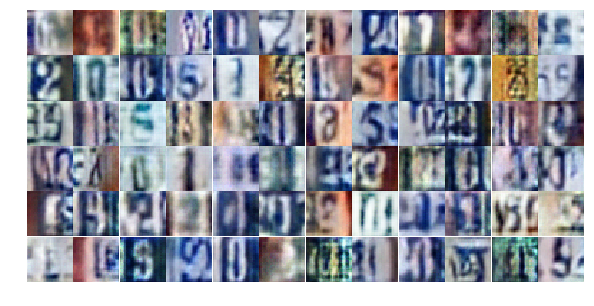

Epoch 8/25... Discriminator Loss: 0.6239... Generator Loss: 1.2047
Epoch 8/25... Discriminator Loss: 0.8469... Generator Loss: 0.8108
Epoch 8/25... Discriminator Loss: 0.4088... Generator Loss: 1.6714
Epoch 8/25... Discriminator Loss: 0.6747... Generator Loss: 1.0109
Epoch 8/25... Discriminator Loss: 1.1752... Generator Loss: 0.4791
Epoch 8/25... Discriminator Loss: 0.4326... Generator Loss: 1.5922
Epoch 8/25... Discriminator Loss: 0.5472... Generator Loss: 1.2738
Epoch 8/25... Discriminator Loss: 0.4141... Generator Loss: 1.5534
Epoch 8/25... Discriminator Loss: 0.6176... Generator Loss: 1.2593
Epoch 8/25... Discriminator Loss: 0.4734... Generator Loss: 1.7871


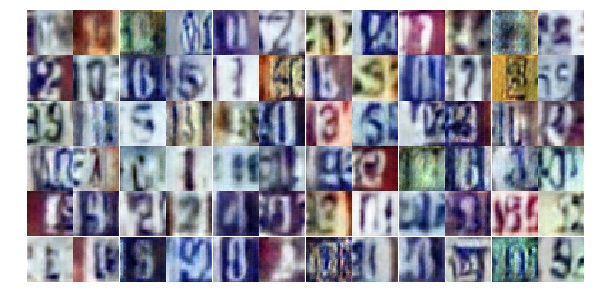

Epoch 8/25... Discriminator Loss: 0.5142... Generator Loss: 2.5806
Epoch 8/25... Discriminator Loss: 1.0783... Generator Loss: 0.5939
Epoch 8/25... Discriminator Loss: 0.6374... Generator Loss: 1.0211
Epoch 8/25... Discriminator Loss: 0.4697... Generator Loss: 1.5505
Epoch 8/25... Discriminator Loss: 0.9813... Generator Loss: 1.2071
Epoch 8/25... Discriminator Loss: 0.8764... Generator Loss: 0.8332
Epoch 8/25... Discriminator Loss: 0.4984... Generator Loss: 1.5988
Epoch 8/25... Discriminator Loss: 0.8955... Generator Loss: 0.8398
Epoch 8/25... Discriminator Loss: 0.7811... Generator Loss: 2.1705
Epoch 8/25... Discriminator Loss: 1.5114... Generator Loss: 0.3846


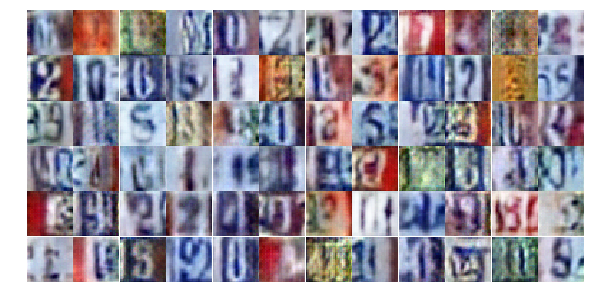

Epoch 8/25... Discriminator Loss: 0.7568... Generator Loss: 1.4972
Epoch 8/25... Discriminator Loss: 0.5245... Generator Loss: 1.5096
Epoch 8/25... Discriminator Loss: 0.4784... Generator Loss: 1.8389
Epoch 8/25... Discriminator Loss: 0.8169... Generator Loss: 0.7818
Epoch 8/25... Discriminator Loss: 0.4001... Generator Loss: 2.0039
Epoch 8/25... Discriminator Loss: 0.9062... Generator Loss: 0.8551
Epoch 8/25... Discriminator Loss: 0.5550... Generator Loss: 1.1922
Epoch 8/25... Discriminator Loss: 0.4406... Generator Loss: 1.6082
Epoch 9/25... Discriminator Loss: 0.9112... Generator Loss: 0.7377
Epoch 9/25... Discriminator Loss: 0.7680... Generator Loss: 0.8890


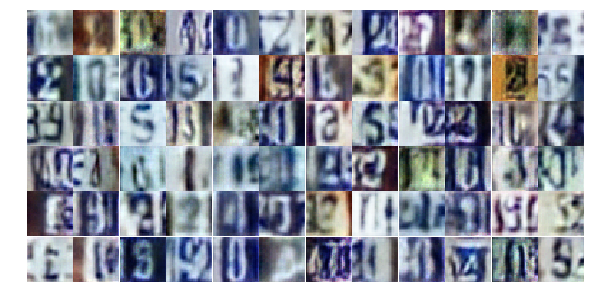

Epoch 9/25... Discriminator Loss: 0.7689... Generator Loss: 0.8631
Epoch 9/25... Discriminator Loss: 0.8057... Generator Loss: 0.8717
Epoch 9/25... Discriminator Loss: 0.7198... Generator Loss: 0.9113
Epoch 9/25... Discriminator Loss: 0.3860... Generator Loss: 2.0158
Epoch 9/25... Discriminator Loss: 0.9133... Generator Loss: 0.7057
Epoch 9/25... Discriminator Loss: 0.4101... Generator Loss: 2.8066
Epoch 9/25... Discriminator Loss: 0.8057... Generator Loss: 1.0902
Epoch 9/25... Discriminator Loss: 0.5006... Generator Loss: 1.4205
Epoch 9/25... Discriminator Loss: 0.7905... Generator Loss: 0.8533
Epoch 9/25... Discriminator Loss: 0.8183... Generator Loss: 0.7912


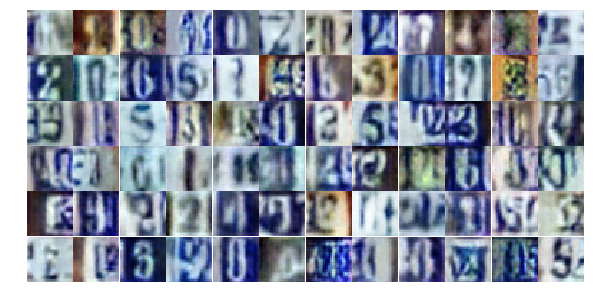

Epoch 9/25... Discriminator Loss: 0.8643... Generator Loss: 0.7430
Epoch 9/25... Discriminator Loss: 1.8975... Generator Loss: 3.6326
Epoch 9/25... Discriminator Loss: 1.0468... Generator Loss: 0.5997
Epoch 9/25... Discriminator Loss: 0.8353... Generator Loss: 0.7966
Epoch 9/25... Discriminator Loss: 0.4926... Generator Loss: 1.5112
Epoch 9/25... Discriminator Loss: 0.7014... Generator Loss: 1.4350
Epoch 9/25... Discriminator Loss: 1.3884... Generator Loss: 0.3888
Epoch 9/25... Discriminator Loss: 0.4414... Generator Loss: 1.6814
Epoch 9/25... Discriminator Loss: 0.8796... Generator Loss: 0.7002
Epoch 9/25... Discriminator Loss: 0.6887... Generator Loss: 0.9817


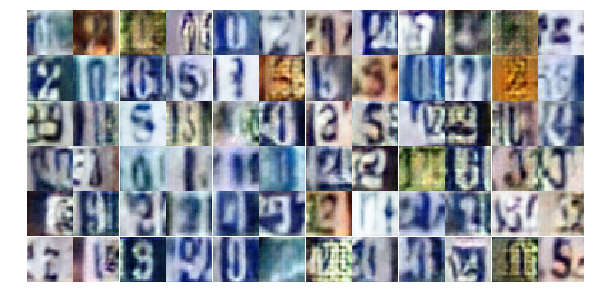

Epoch 9/25... Discriminator Loss: 0.8298... Generator Loss: 0.9576
Epoch 9/25... Discriminator Loss: 0.6604... Generator Loss: 1.0142
Epoch 9/25... Discriminator Loss: 0.7966... Generator Loss: 1.4217
Epoch 9/25... Discriminator Loss: 0.4865... Generator Loss: 1.4358
Epoch 9/25... Discriminator Loss: 0.5214... Generator Loss: 1.6200
Epoch 9/25... Discriminator Loss: 0.5580... Generator Loss: 1.2729
Epoch 9/25... Discriminator Loss: 1.6398... Generator Loss: 0.3067
Epoch 9/25... Discriminator Loss: 0.6380... Generator Loss: 2.1493
Epoch 9/25... Discriminator Loss: 0.7723... Generator Loss: 0.8584
Epoch 9/25... Discriminator Loss: 0.6189... Generator Loss: 1.0657


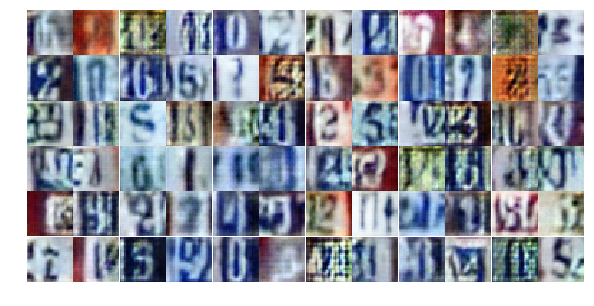

Epoch 9/25... Discriminator Loss: 0.6872... Generator Loss: 0.9888
Epoch 9/25... Discriminator Loss: 0.4940... Generator Loss: 1.3427
Epoch 9/25... Discriminator Loss: 0.7604... Generator Loss: 1.1133
Epoch 9/25... Discriminator Loss: 0.6243... Generator Loss: 1.2858
Epoch 9/25... Discriminator Loss: 0.5412... Generator Loss: 1.3411
Epoch 9/25... Discriminator Loss: 0.7182... Generator Loss: 0.9945
Epoch 9/25... Discriminator Loss: 0.5582... Generator Loss: 1.8020
Epoch 9/25... Discriminator Loss: 0.4297... Generator Loss: 1.7787
Epoch 9/25... Discriminator Loss: 1.1425... Generator Loss: 0.5387
Epoch 9/25... Discriminator Loss: 0.7566... Generator Loss: 0.8690


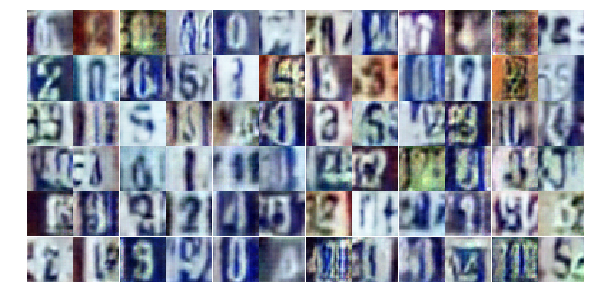

Epoch 9/25... Discriminator Loss: 0.6273... Generator Loss: 1.0576
Epoch 9/25... Discriminator Loss: 2.0953... Generator Loss: 3.6351
Epoch 9/25... Discriminator Loss: 0.5781... Generator Loss: 1.4453
Epoch 9/25... Discriminator Loss: 0.6120... Generator Loss: 1.4725
Epoch 9/25... Discriminator Loss: 0.4343... Generator Loss: 1.6101
Epoch 9/25... Discriminator Loss: 1.1499... Generator Loss: 0.5387
Epoch 9/25... Discriminator Loss: 0.5520... Generator Loss: 1.1959
Epoch 9/25... Discriminator Loss: 0.6472... Generator Loss: 0.9952
Epoch 9/25... Discriminator Loss: 0.8130... Generator Loss: 0.9882
Epoch 9/25... Discriminator Loss: 1.0543... Generator Loss: 2.1101


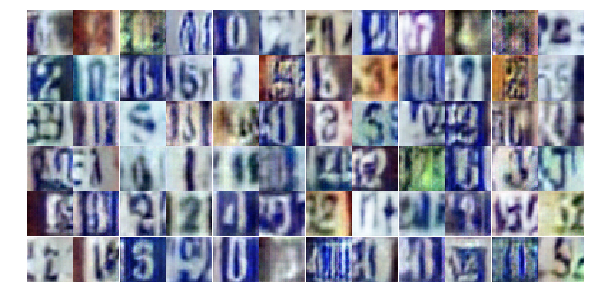

Epoch 9/25... Discriminator Loss: 1.4942... Generator Loss: 0.3930
Epoch 9/25... Discriminator Loss: 0.7842... Generator Loss: 1.8747
Epoch 9/25... Discriminator Loss: 0.6503... Generator Loss: 1.4813
Epoch 9/25... Discriminator Loss: 1.0438... Generator Loss: 0.6098
Epoch 9/25... Discriminator Loss: 0.7023... Generator Loss: 1.0607
Epoch 10/25... Discriminator Loss: 0.5176... Generator Loss: 1.7308
Epoch 10/25... Discriminator Loss: 0.5465... Generator Loss: 1.2348
Epoch 10/25... Discriminator Loss: 0.6323... Generator Loss: 1.0358
Epoch 10/25... Discriminator Loss: 0.8057... Generator Loss: 1.2956
Epoch 10/25... Discriminator Loss: 1.5446... Generator Loss: 0.3262


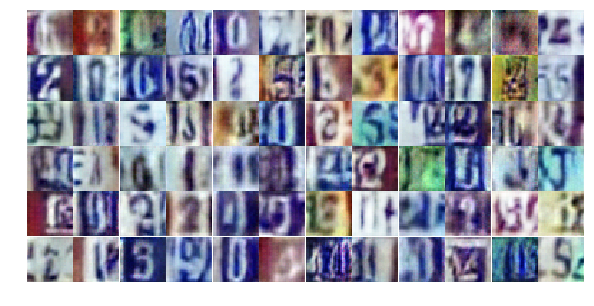

Epoch 10/25... Discriminator Loss: 0.5500... Generator Loss: 1.6884
Epoch 10/25... Discriminator Loss: 0.6951... Generator Loss: 1.1684
Epoch 10/25... Discriminator Loss: 0.5356... Generator Loss: 1.3622
Epoch 10/25... Discriminator Loss: 0.6192... Generator Loss: 1.3300
Epoch 10/25... Discriminator Loss: 0.9147... Generator Loss: 2.2693
Epoch 10/25... Discriminator Loss: 0.6780... Generator Loss: 1.4706
Epoch 10/25... Discriminator Loss: 0.4185... Generator Loss: 1.4736
Epoch 10/25... Discriminator Loss: 1.2080... Generator Loss: 0.4824
Epoch 10/25... Discriminator Loss: 2.2230... Generator Loss: 0.2190
Epoch 10/25... Discriminator Loss: 0.6213... Generator Loss: 1.5328


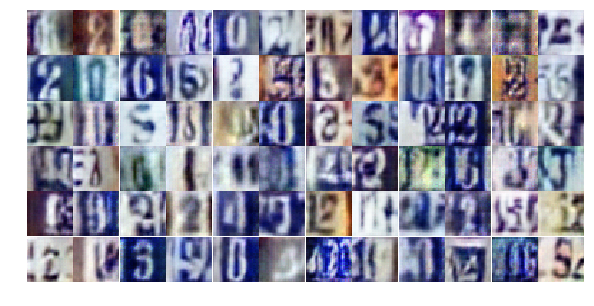

Epoch 10/25... Discriminator Loss: 0.6764... Generator Loss: 1.4254
Epoch 10/25... Discriminator Loss: 0.9542... Generator Loss: 0.6726
Epoch 10/25... Discriminator Loss: 0.4292... Generator Loss: 1.4823
Epoch 10/25... Discriminator Loss: 1.4663... Generator Loss: 0.3772
Epoch 10/25... Discriminator Loss: 0.6806... Generator Loss: 1.0539
Epoch 10/25... Discriminator Loss: 0.5090... Generator Loss: 1.5134
Epoch 10/25... Discriminator Loss: 0.5896... Generator Loss: 1.2102
Epoch 10/25... Discriminator Loss: 0.5233... Generator Loss: 1.2533
Epoch 10/25... Discriminator Loss: 0.8095... Generator Loss: 1.0966
Epoch 10/25... Discriminator Loss: 0.3917... Generator Loss: 1.8363


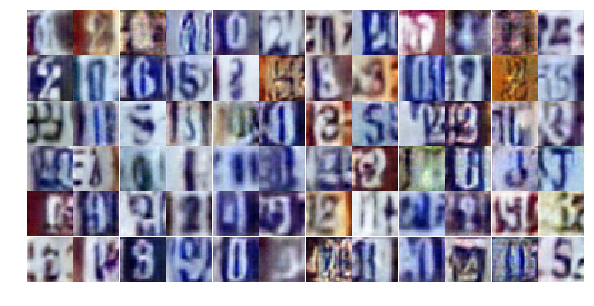

Epoch 10/25... Discriminator Loss: 0.5548... Generator Loss: 1.1126
Epoch 10/25... Discriminator Loss: 0.6334... Generator Loss: 1.1764
Epoch 10/25... Discriminator Loss: 0.4494... Generator Loss: 1.4325
Epoch 10/25... Discriminator Loss: 0.5331... Generator Loss: 1.9759
Epoch 10/25... Discriminator Loss: 1.6535... Generator Loss: 0.2857
Epoch 10/25... Discriminator Loss: 0.6504... Generator Loss: 1.1974
Epoch 10/25... Discriminator Loss: 0.3122... Generator Loss: 1.7323
Epoch 10/25... Discriminator Loss: 0.9462... Generator Loss: 0.6725
Epoch 10/25... Discriminator Loss: 0.5337... Generator Loss: 1.2272
Epoch 10/25... Discriminator Loss: 0.7325... Generator Loss: 0.8532


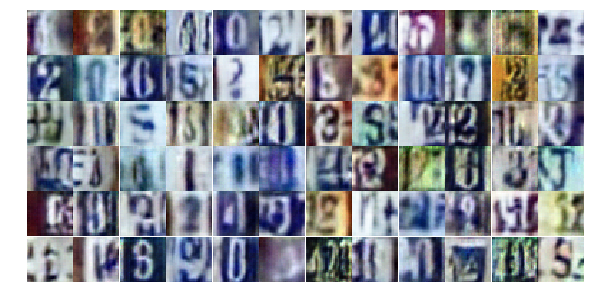

Epoch 10/25... Discriminator Loss: 1.5449... Generator Loss: 3.9526
Epoch 10/25... Discriminator Loss: 1.2792... Generator Loss: 0.5017
Epoch 10/25... Discriminator Loss: 0.6887... Generator Loss: 1.6452
Epoch 10/25... Discriminator Loss: 0.8272... Generator Loss: 1.0662
Epoch 10/25... Discriminator Loss: 0.7255... Generator Loss: 0.9728
Epoch 10/25... Discriminator Loss: 1.3789... Generator Loss: 0.3916
Epoch 10/25... Discriminator Loss: 0.5913... Generator Loss: 1.1658
Epoch 10/25... Discriminator Loss: 0.8042... Generator Loss: 0.9156
Epoch 10/25... Discriminator Loss: 0.6410... Generator Loss: 1.1507
Epoch 10/25... Discriminator Loss: 0.7867... Generator Loss: 0.8626


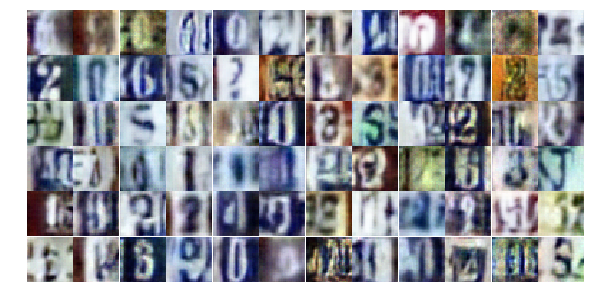

Epoch 10/25... Discriminator Loss: 0.5351... Generator Loss: 1.2563
Epoch 10/25... Discriminator Loss: 0.7574... Generator Loss: 0.9314
Epoch 10/25... Discriminator Loss: 0.6285... Generator Loss: 1.1108
Epoch 10/25... Discriminator Loss: 0.5908... Generator Loss: 1.4066
Epoch 10/25... Discriminator Loss: 0.3896... Generator Loss: 1.7711
Epoch 10/25... Discriminator Loss: 0.6239... Generator Loss: 1.2006
Epoch 10/25... Discriminator Loss: 0.4946... Generator Loss: 1.7663
Epoch 10/25... Discriminator Loss: 0.6248... Generator Loss: 2.5309
Epoch 10/25... Discriminator Loss: 0.6635... Generator Loss: 1.6418
Epoch 10/25... Discriminator Loss: 0.7240... Generator Loss: 1.1270


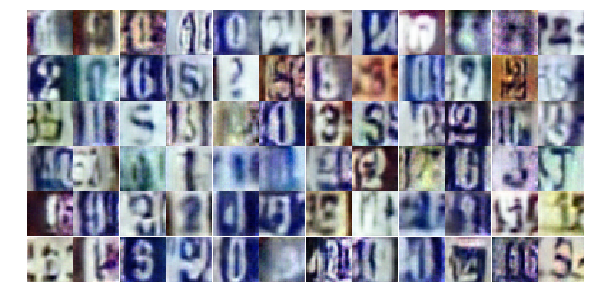

Epoch 10/25... Discriminator Loss: 0.8497... Generator Loss: 1.3836
Epoch 10/25... Discriminator Loss: 0.6143... Generator Loss: 1.1208
Epoch 10/25... Discriminator Loss: 0.4490... Generator Loss: 1.7504
Epoch 11/25... Discriminator Loss: 0.7857... Generator Loss: 1.1219
Epoch 11/25... Discriminator Loss: 0.6115... Generator Loss: 1.0802
Epoch 11/25... Discriminator Loss: 1.3296... Generator Loss: 0.4367
Epoch 11/25... Discriminator Loss: 0.5524... Generator Loss: 1.1719
Epoch 11/25... Discriminator Loss: 0.6661... Generator Loss: 1.3360
Epoch 11/25... Discriminator Loss: 1.3299... Generator Loss: 0.4471
Epoch 11/25... Discriminator Loss: 0.4196... Generator Loss: 1.7806


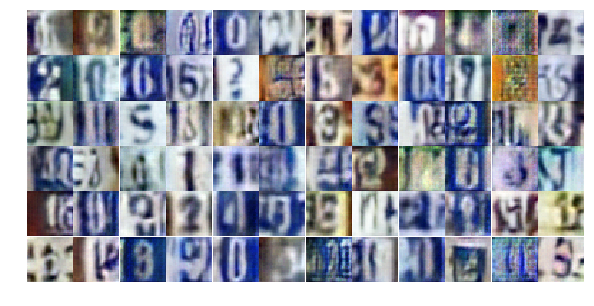

Epoch 11/25... Discriminator Loss: 0.3726... Generator Loss: 2.0816
Epoch 11/25... Discriminator Loss: 0.6045... Generator Loss: 1.3862
Epoch 11/25... Discriminator Loss: 0.3645... Generator Loss: 1.6559
Epoch 11/25... Discriminator Loss: 0.5628... Generator Loss: 1.2087
Epoch 11/25... Discriminator Loss: 0.9488... Generator Loss: 0.7319
Epoch 11/25... Discriminator Loss: 0.5176... Generator Loss: 1.3296
Epoch 11/25... Discriminator Loss: 0.6019... Generator Loss: 1.5176
Epoch 11/25... Discriminator Loss: 0.3547... Generator Loss: 2.2500
Epoch 11/25... Discriminator Loss: 1.0325... Generator Loss: 0.6882
Epoch 11/25... Discriminator Loss: 1.3673... Generator Loss: 0.4376


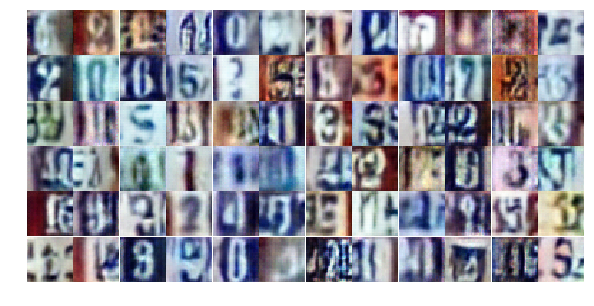

Epoch 11/25... Discriminator Loss: 0.8479... Generator Loss: 0.7726
Epoch 11/25... Discriminator Loss: 0.5021... Generator Loss: 1.8948
Epoch 11/25... Discriminator Loss: 0.7210... Generator Loss: 0.9035
Epoch 11/25... Discriminator Loss: 0.6131... Generator Loss: 1.1016
Epoch 11/25... Discriminator Loss: 0.2747... Generator Loss: 2.1995
Epoch 11/25... Discriminator Loss: 0.4083... Generator Loss: 1.7724
Epoch 11/25... Discriminator Loss: 0.5117... Generator Loss: 1.3239
Epoch 11/25... Discriminator Loss: 1.6911... Generator Loss: 0.3298
Epoch 11/25... Discriminator Loss: 0.3780... Generator Loss: 2.0997
Epoch 11/25... Discriminator Loss: 1.0764... Generator Loss: 0.6137


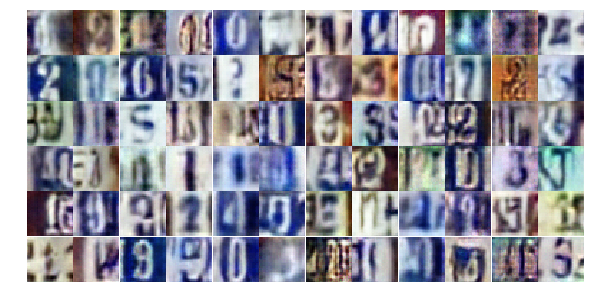

Epoch 11/25... Discriminator Loss: 0.8354... Generator Loss: 0.9637
Epoch 11/25... Discriminator Loss: 0.6454... Generator Loss: 1.8093
Epoch 11/25... Discriminator Loss: 0.7331... Generator Loss: 0.9655
Epoch 11/25... Discriminator Loss: 0.5134... Generator Loss: 1.2949
Epoch 11/25... Discriminator Loss: 0.6505... Generator Loss: 1.1097
Epoch 11/25... Discriminator Loss: 0.8628... Generator Loss: 0.7973
Epoch 11/25... Discriminator Loss: 1.1228... Generator Loss: 0.6440
Epoch 11/25... Discriminator Loss: 1.0483... Generator Loss: 0.5920
Epoch 11/25... Discriminator Loss: 0.5722... Generator Loss: 1.2326
Epoch 11/25... Discriminator Loss: 1.4083... Generator Loss: 0.3656


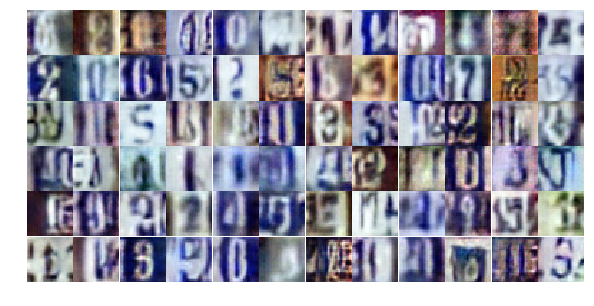

Epoch 11/25... Discriminator Loss: 0.5038... Generator Loss: 1.4626
Epoch 11/25... Discriminator Loss: 0.4821... Generator Loss: 1.4768
Epoch 11/25... Discriminator Loss: 0.7831... Generator Loss: 0.8632
Epoch 11/25... Discriminator Loss: 0.5903... Generator Loss: 1.8107
Epoch 11/25... Discriminator Loss: 0.7196... Generator Loss: 0.8979
Epoch 11/25... Discriminator Loss: 0.5336... Generator Loss: 1.2344
Epoch 11/25... Discriminator Loss: 0.3792... Generator Loss: 1.5439
Epoch 11/25... Discriminator Loss: 0.7342... Generator Loss: 0.8967
Epoch 11/25... Discriminator Loss: 0.8575... Generator Loss: 0.9646
Epoch 11/25... Discriminator Loss: 0.7379... Generator Loss: 0.9869


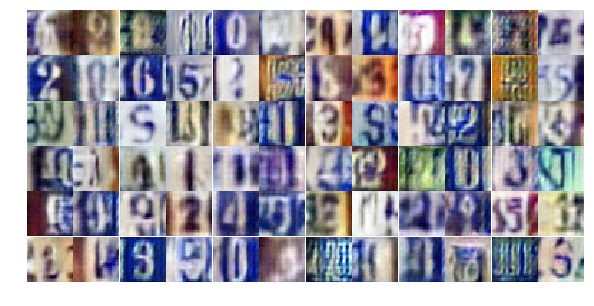

Epoch 11/25... Discriminator Loss: 0.6086... Generator Loss: 1.3791
Epoch 11/25... Discriminator Loss: 0.5208... Generator Loss: 1.4040
Epoch 11/25... Discriminator Loss: 0.8010... Generator Loss: 1.0716
Epoch 11/25... Discriminator Loss: 0.5239... Generator Loss: 1.2296
Epoch 11/25... Discriminator Loss: 1.4098... Generator Loss: 0.4156
Epoch 11/25... Discriminator Loss: 0.6446... Generator Loss: 1.0439
Epoch 11/25... Discriminator Loss: 0.9254... Generator Loss: 0.8307
Epoch 11/25... Discriminator Loss: 0.4926... Generator Loss: 1.5522
Epoch 11/25... Discriminator Loss: 0.8222... Generator Loss: 0.9020
Epoch 11/25... Discriminator Loss: 1.4161... Generator Loss: 0.4495


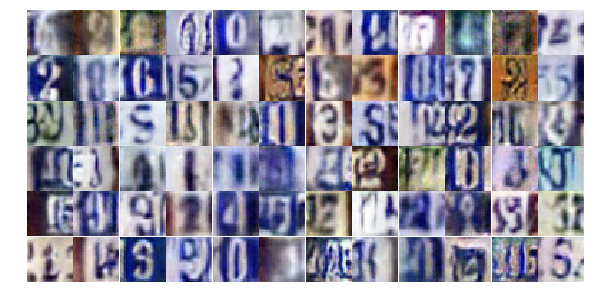

Epoch 12/25... Discriminator Loss: 0.7386... Generator Loss: 1.0775
Epoch 12/25... Discriminator Loss: 0.5502... Generator Loss: 1.2649
Epoch 12/25... Discriminator Loss: 1.0499... Generator Loss: 0.5912
Epoch 12/25... Discriminator Loss: 0.4580... Generator Loss: 1.8565
Epoch 12/25... Discriminator Loss: 0.4130... Generator Loss: 1.4467
Epoch 12/25... Discriminator Loss: 0.9708... Generator Loss: 0.6738
Epoch 12/25... Discriminator Loss: 0.4845... Generator Loss: 1.9886
Epoch 12/25... Discriminator Loss: 0.5126... Generator Loss: 1.6534
Epoch 12/25... Discriminator Loss: 0.8229... Generator Loss: 0.9837
Epoch 12/25... Discriminator Loss: 1.3961... Generator Loss: 0.4166


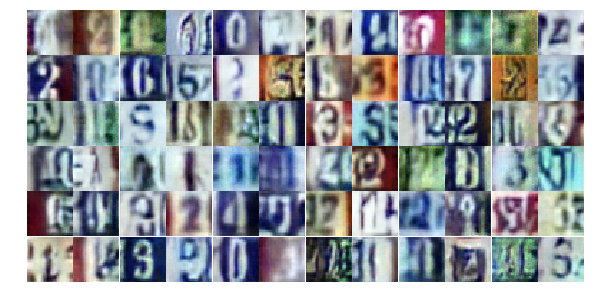

Epoch 12/25... Discriminator Loss: 0.4154... Generator Loss: 1.5276
Epoch 12/25... Discriminator Loss: 1.0883... Generator Loss: 0.5546
Epoch 12/25... Discriminator Loss: 0.4225... Generator Loss: 1.7873
Epoch 12/25... Discriminator Loss: 0.6603... Generator Loss: 1.1817
Epoch 12/25... Discriminator Loss: 0.4328... Generator Loss: 1.9254
Epoch 12/25... Discriminator Loss: 1.4432... Generator Loss: 0.5014
Epoch 12/25... Discriminator Loss: 1.5990... Generator Loss: 0.2982
Epoch 12/25... Discriminator Loss: 0.4654... Generator Loss: 1.7079
Epoch 12/25... Discriminator Loss: 0.4590... Generator Loss: 1.6414
Epoch 12/25... Discriminator Loss: 0.6887... Generator Loss: 0.9966


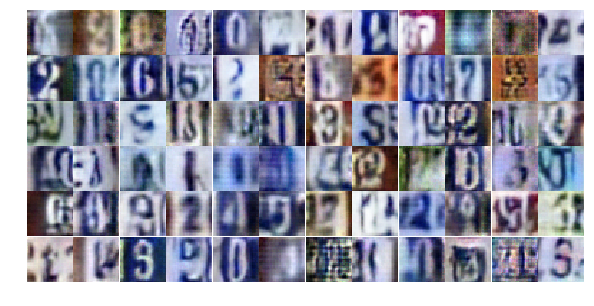

Epoch 12/25... Discriminator Loss: 0.3966... Generator Loss: 1.5543
Epoch 12/25... Discriminator Loss: 0.4341... Generator Loss: 1.5364
Epoch 12/25... Discriminator Loss: 0.5560... Generator Loss: 1.2415
Epoch 12/25... Discriminator Loss: 0.3885... Generator Loss: 1.8134
Epoch 12/25... Discriminator Loss: 0.4797... Generator Loss: 1.7688
Epoch 12/25... Discriminator Loss: 0.5001... Generator Loss: 1.2626
Epoch 12/25... Discriminator Loss: 0.5345... Generator Loss: 1.7723
Epoch 12/25... Discriminator Loss: 0.3708... Generator Loss: 1.6927
Epoch 12/25... Discriminator Loss: 0.6009... Generator Loss: 1.0999
Epoch 12/25... Discriminator Loss: 0.5782... Generator Loss: 1.3105


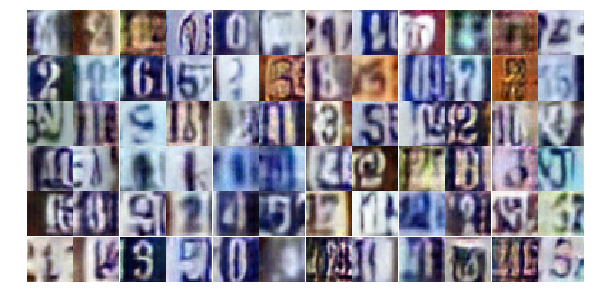

Epoch 12/25... Discriminator Loss: 0.5382... Generator Loss: 1.2745
Epoch 12/25... Discriminator Loss: 1.2962... Generator Loss: 0.4891
Epoch 12/25... Discriminator Loss: 0.6689... Generator Loss: 1.0249
Epoch 12/25... Discriminator Loss: 1.5474... Generator Loss: 0.3471
Epoch 12/25... Discriminator Loss: 1.0693... Generator Loss: 0.6078
Epoch 12/25... Discriminator Loss: 0.7711... Generator Loss: 0.9185
Epoch 12/25... Discriminator Loss: 0.9726... Generator Loss: 0.7020
Epoch 12/25... Discriminator Loss: 0.9908... Generator Loss: 0.7309
Epoch 12/25... Discriminator Loss: 0.4882... Generator Loss: 1.7430
Epoch 12/25... Discriminator Loss: 0.3109... Generator Loss: 2.0360


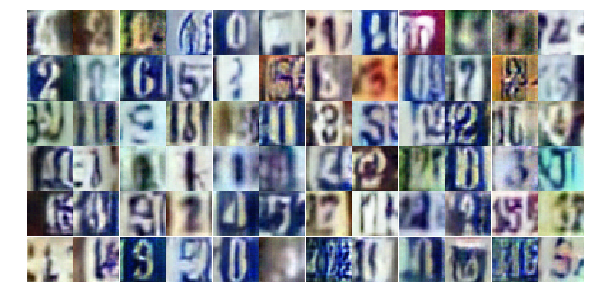

Epoch 12/25... Discriminator Loss: 0.7181... Generator Loss: 2.1518
Epoch 12/25... Discriminator Loss: 0.4957... Generator Loss: 1.1938
Epoch 12/25... Discriminator Loss: 0.4563... Generator Loss: 1.4440
Epoch 12/25... Discriminator Loss: 1.0906... Generator Loss: 0.7254
Epoch 12/25... Discriminator Loss: 1.0075... Generator Loss: 0.6157
Epoch 12/25... Discriminator Loss: 0.9023... Generator Loss: 0.7769
Epoch 12/25... Discriminator Loss: 0.8817... Generator Loss: 0.8395
Epoch 12/25... Discriminator Loss: 0.8457... Generator Loss: 0.8995
Epoch 12/25... Discriminator Loss: 0.4557... Generator Loss: 2.0672
Epoch 12/25... Discriminator Loss: 0.6471... Generator Loss: 1.5129


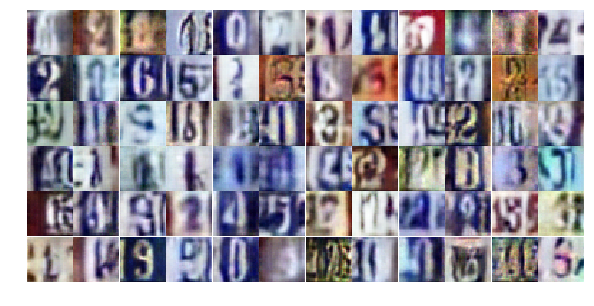

Epoch 12/25... Discriminator Loss: 0.8105... Generator Loss: 0.9593
Epoch 12/25... Discriminator Loss: 0.5956... Generator Loss: 1.2013
Epoch 12/25... Discriminator Loss: 1.3124... Generator Loss: 2.8645
Epoch 12/25... Discriminator Loss: 1.0130... Generator Loss: 0.8530
Epoch 12/25... Discriminator Loss: 0.5689... Generator Loss: 1.3193
Epoch 12/25... Discriminator Loss: 0.5630... Generator Loss: 1.6280
Epoch 12/25... Discriminator Loss: 0.7893... Generator Loss: 0.8998
Epoch 13/25... Discriminator Loss: 0.6003... Generator Loss: 1.1611
Epoch 13/25... Discriminator Loss: 0.5655... Generator Loss: 1.3530
Epoch 13/25... Discriminator Loss: 1.1115... Generator Loss: 0.5532


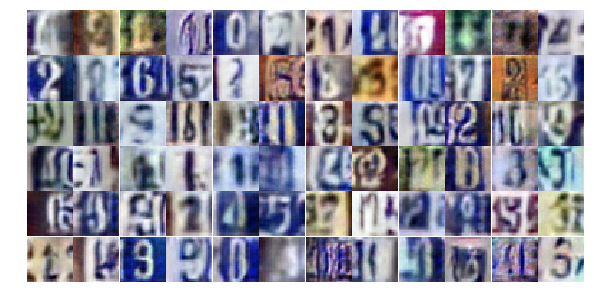

Epoch 13/25... Discriminator Loss: 0.6247... Generator Loss: 1.1163
Epoch 13/25... Discriminator Loss: 0.6157... Generator Loss: 1.1976
Epoch 13/25... Discriminator Loss: 1.0287... Generator Loss: 0.8211
Epoch 13/25... Discriminator Loss: 0.9141... Generator Loss: 0.7626
Epoch 13/25... Discriminator Loss: 0.8112... Generator Loss: 0.8034
Epoch 13/25... Discriminator Loss: 0.5347... Generator Loss: 1.3738
Epoch 13/25... Discriminator Loss: 0.3843... Generator Loss: 1.6759
Epoch 13/25... Discriminator Loss: 1.0009... Generator Loss: 0.7649
Epoch 13/25... Discriminator Loss: 0.6174... Generator Loss: 1.1059


In [ ]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))